# Land cover classification
 **Remote Sensing, SICOM EEH**
 

# 1. Introduction

The purpose of this lab session is to work on a **land cover classification** problem, in which we would like to automatically assign to each pixel of an image its corresponding land cover type (e.g., grass, road, building...).
In this lab, we will use a **hyperspectral image** as input to the classification problem.
The image was acquired on Washington DC Mall, Washington, DC, United States (https://goo.gl/maps/prYNey1N5z81ZtcE7) using an hyperspectral camera mounted on an airplane. More information on the data are available in the Appendix of this notebook.
We assume that the land cover types are known beforehand and that some parts of the image have been already labelled, leading to a **supervised classification** problem.

Hyperspectral images can provide rich spectral information that can be exploited in the classification problem as classes are assumed to have different material composition and thus different spectral properties.
The spectral information can indeed be a discriminant feature in the classification problem, but the spatial arrangment of pixels within the image can also be an important source of information.

# 1.1 Outline of the practical section

This notebook is divided into different parts as an example of a possible pipeline in the experimental analysis:
- data visualization
- exploratory analysis
- dimensionality reduction
- classification
- exploitation of spatial features


# 1.2 Needed packages

This cells contains all the packages and functions that are needed for executing all the cells of this notebook. Please feel free to add new `import` statements to customize the code and to make new additional experiments. 

In [11]:
# Uncomment this for installing the required packages
# !pip install seaborn scikit-image scikit-learn pandas

In [12]:
import scipy.io
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import matplotlib
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import seaborn as sns
import pandas as pd
from skimage.morphology import disk, erosion, reconstruction
from skimage.util import invert

from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

In [13]:
%matplotlib inline

Define some utility functions that will be used in the following.

In [14]:
def imshow_stretch(I, stretchval=0.1, cmap='gray'):
    """Show a grayscale or RGB image after performing a stretching of its dynamic"""
    nbins = 1000
    tol_low = stretchval
    tol_high = 1-stretchval
    Iadj = np.zeros(I.shape)
    
    n_bands = 1 if len(I.shape) < 3 else I.shape[2]
    for i in range(n_bands):
        tmp = I if n_bands == 1 else I[:,:,i]
        tmp = tmp - np.min(tmp.ravel())
        tmp = tmp / np.max(tmp.ravel())
        N, _ = np.histogram(tmp.ravel(), nbins)
        cdf = np.cumsum(N)/np.sum(N)  # cumulative distribution function
        ilow = np.where(cdf > tol_low)[0][0]
        ihigh = np.where(cdf >= tol_high)[0][0]
        ilow = (ilow - 1)/(nbins-1)
        ihigh = (ihigh - 1)/(nbins-1)
        li = ilow
        lo = 0
        hi = ihigh
        ho = 255
        shape = tmp.shape
        out = (tmp < li) * lo
        out = out + np.logical_and(tmp >= li, tmp < hi) * (lo + (ho - lo) * ((tmp - li) / (hi - li)))
        out = out + (tmp >= hi) * ho
        if n_bands == 1:
            Iadj = out
        else:
            Iadj[:,:,i] = out
    plt.imshow(Iadj.astype('uint8'), cmap=cmap)

def gen_train_test(orig_labels, labeled_classes, classes, n_samples_per_class):
    """function generating a training and a test set from the labelled set of 
    samples L (typically an image with labelled pixels set to values greater
    than zero and correspondent to their class index).
    Warning! It is assumed that the given number of samples is not less than
    the minimum available number of labelled samples for each class."""
    n_classes = classes.shape[0]
    # generate a random set of labelled samples used for training
    tr_idx = np.zeros((n_samples_per_class * n_classes,), dtype=int)
    for i in range(n_classes):
        idx = np.where(orig_labels == classes[i])[0]
        idx = idx[np.random.permutation(idx.shape[0])]
        tr_idx[i * n_samples_per_class : (i + 1) * n_samples_per_class] = idx[:n_samples_per_class]
    # remove samples used for training from the test
    ts = np.copy(orig_labels)
    tr_idx = tr_idx.astype(int)
    ts[tr_idx] = 0
    ts_idx = np.where(ts > 0)[0]
    return tr_idx, ts_idx
    
def morph_prof(im, si, st, nb):
    """Computes the morphological profile by using a circular SE (disk)
    and returns a solution in multispectral format: [h w nb_b]
    #
    # INPUTS
    #
    # im: the images to processed
    # si: the size of the se
    # st: the step of the size
    # nb the number of opening/closing
    #
    # OUTPUTS
    #
    # MP: the morphological profile."""
    H, W = im.shape
    imc = invert(im)
    MP = np.zeros((H, W, 2 * nb + 1))
    i=1
    MP[:, :, nb] = im
    # Computing MP
    for j in range(nb):
        se = disk(si)
        temp0 = erosion(im, footprint=se)
        tempC = erosion(imc, footprint=se)
        temp0 = reconstruction(temp0, im)
        tempC = reconstruction(tempC, imc)
        MP[:,:,nb + i] = temp0
        MP[:,:,nb - i] = invert(tempC)
        si += st
        i += 1
    return MP

# 1.3 Random seed setting

Throughout the notebook, we will use some random generators. You may want to fix the seed in input to the PRNG* in order to have reproducible results throughout several trials.
By changing the seed value, different outputs are obtained from the generator.

\* Pseudo-Random Number Generator: a deterministic algorithm for generating a pseudo-random sequence of numbers from a *seed*. By fixing the seed, you will obtain the same sequence once restarted the algorithm.


In [15]:
np.random.seed(42)

# 1.4 Data loading and preparation

The variable `data` will contain the hyperspectral image.
Check the size of the image (num rows, num cols, num bands) by typing `data.shape`. The number of rows, columns and bands are stored in the variables `n_rows`, `n_columns` and `n_bands`, respectively.

The patterns to classify in this problem are the image pixels, leading to a pixel-wise classification.
For some operations in the following, it is convenient to reshape the image datacube (a 3-way tensor) into a matrix with pixels on the rows and bands on the columns.
This is easily achieved by concatenting the rows (or columns) of the original `data` array, leading to `data_array`.

Some areas in the image have been already annotated by assigning a semantic land cover class to pixels, see `gt`.
This information can be considered as a reference (**ground truth**) that can be used for training (and testing) a supervised classifier.
Each labelleed pixel is associated to an integer value between 1 and 7 denoting the land cover type.
Pixels without label are associated to zero.

In [16]:
data = scipy.io.loadmat('data/dcmall.mat')['data']  # hyperspectral image
gt = scipy.io.loadmat('data/dcmall.mat')['test'] # ground truth
class_names = scipy.io.loadmat('data/dcmall.mat')['class_names'] # name of land cover types
class_colormap = scipy.io.loadmat('data/dcmall.mat')['class_colormap'] # color code associated to different classes

# the original hyperspectral image and the associated reference image are reshaped in matrix/vector format 
n_rows, n_columns, n_bands = data.shape
data_array = data.reshape((n_rows * n_columns, n_bands))
labels = gt.reshape((n_rows * n_columns, 1)) 

# labels from 1 to 7 are associated to land cover classes, 0 is no label
orig_labels=np.copy(labels)
valid_indices = labels != 0
labels = labels[valid_indices] # extract only the labels different from zero

# 2. Data visualization

This part of the session is devoted to the visualization and inspection of the hyperspectral image acquired over Washington DC Mall.


- Visualize the image data
- Look at one band of the image with the function `imshow_stretch` (e.g., if you want to see the 15th band you should type: `imshow_stretch(data[:,:,14])`).
  Beware that when stretching the data, the image values are rescaled between 0 and 256. 
- Open the file `wavelengths.txt`: it lists the correspondence between the band number and the central wavelenght of its spectral response function.
  After the acquisition some bands were affected by a low signal to noise ratio and have been removed.
  The data in the file is arranged in three columns. 
  - First column: Index of the original 210 bands 
  - Second column: Center Wavelength (nm)
  - Third column: Index of the 191 bands (bands with an 'x' have been removed)


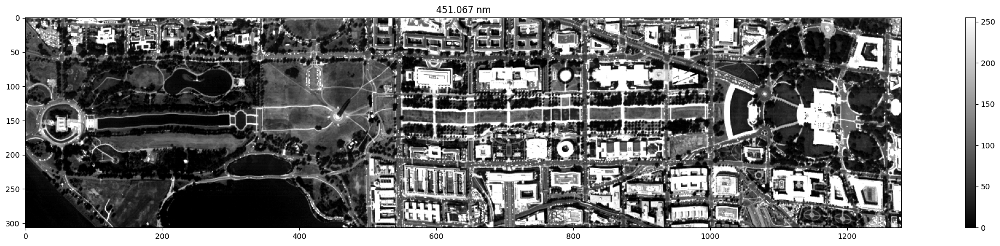

In [17]:
# Load wavelengths
wl = np.load('data/wavelengths.npy')

# example showing the 15th band rotated for better visualization
plt.figure(figsize=(30,5))
band = 14
# plt.imshow(np.flipud(data[:,:,14].T), cmap='gray') # visualize the image without stretching
# imshow_stretch(data[:,:,band].transpose(1,0,2), cmap='gray')  # use stretching
imshow_stretch(np.flipud(data[:,:,14].T), cmap='gray')  # use stretching
plt.title(f'{wl[band]} nm')
plt.colorbar()
plt.show()

**Questions**

![](figs/Em_spect.jpg)

* By looking at the figure above, identify the band number (approximately) corresponding to the wavelength of the red, green and blue color. Show a true color composition (R, G, B) of the hyperspectral image by typing: `imshow_stretch(data[:,:,(bR, bG, bB)])`.

* Select a band number corresponding to the wavelength in the Near Infrared (NIR) range of the spectrum. Show a false color composition (NIR, R, G) of the hyperspectral image.

* What can you assert by comparing the true and false color compositions?

* Perform an interpretation of the image by looking at the color representations.
   * Which thematic classes can you determine?
   * Which different land cover classes can be determined thanks to the **spectral** and which thanks to the **spatial** resolution of the image?
* By looking at the image, can you guess if the the image was spatially corrected? (*Note that the image was acquired by an airplane. Typically in this scenario the main source of spatial distortions is due to the movement of the platform.*)



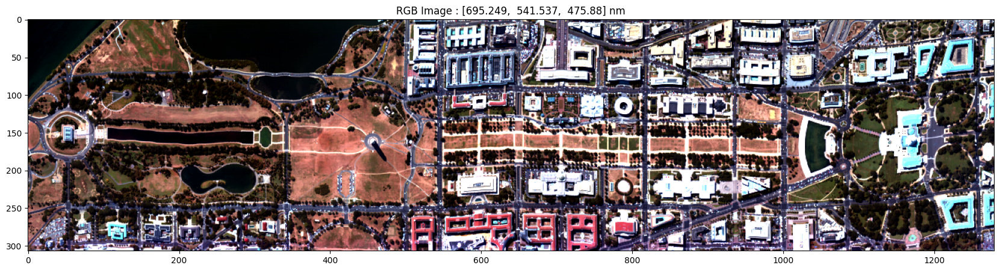

In [18]:
# example showing a composite of three arbitrary bands
bands_real = (53, 33, 20)

plt.figure(figsize=(30,5))
imshow_stretch(data[:,:,bands_real].transpose(1,0,2))  # use stretching
plt.title(f'RGB Image : [{wl[bands_real[0]]},  {wl[bands_real[1]]},  {wl[bands_real[2]]}] nm')
plt.show()

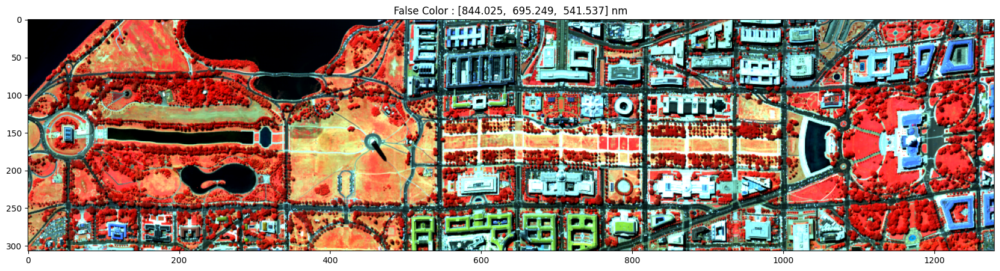

In [19]:
# example showing a composite of three arbitrary bands
bands_false = (66, 53, 33)

plt.figure(figsize=(30,5))
imshow_stretch(data[:,:,bands_false].transpose(1,0,2))  # use stretching
plt.title(f'False Color : [{wl[bands_false[0]]},  {wl[bands_false[1]]},  {wl[bands_false[2]]}] nm')
plt.show()

### Answer :

- For false color, the vegetation will mainly appears in Red on the image, whereas in True image it will be the same as in real life. Moreover, building are mostly light blue in the false color in comparison with true color where they are white. In general, false color makes a more define comparison between areas : building and vegetation.

  - By looking at the different red intensities, we well determine the differents types of vegetation in the False Color image : trees in dark red, grass and sands in   orange-yellow-lightred. In both images, the water appears to be dark, no reflection. 
    The blue color will represents the urban area. Roads will be in dark blue, building in light blue.
  - By the spatial resolution, we can identify the trees as small points. Spectral insights show the different types of field : sand or grass.

- By looking at the lake on the middle left part of the image, we can identify some distorsion that may be due to the airplane acquisition. Therefore the image is raw data, that were not spatially corrected.

# 3. Exploratory analysis

In this part you will perform some simple data inspections in order to gain more insights about the data.



# 3.1 Band inspection and analysis

1. Look at the different bands and their histogram. You can use the interactive visualization provided below or visualize a single band *b* by typing: `imshow_stretch(data[:,:,b])`.
   * What can you state? Are the bands significantly different one to the other? Are they “equally informative”?

![atmwin](figs/atmoswindows1.png)

2. Take a look at the figure above.
   * Can you see any correspondence between the spectrum of the atmospheric absorption and how the data looks like at the different wavelengths?

In [20]:
# Show bands interactively
@interact(b=widgets.IntSlider(min=0, max=n_bands-1, step=1, value=0))
def visualize_band(b):
    plt.figure(figsize=(20,10))
    plt.subplot(211)
    imshow_stretch(np.flipud(data[:,:,b].T), cmap='gray') 
    plt.title(f'band index: {b}, wavelength: {wl[b]}nm')
    plt.subplot(212)
    plt.hist(data[:,:,b].flatten(), bins=data[:,:,b].max()-data[:,:,b].min()+1)
    plt.show()

interactive(children=(IntSlider(value=0, description='b', max=190), Output()), _dom_classes=('widget-interact'…

### Answer :

- The histograms for the bands index between 1 to 60 are almost the same. Then we have a different shape that will be almost repeated between 60 to 100. And so on... What can we say is that only a few categories of band are informative. The discretization of each bands is too small, making a lot of redundant information over the global spectral acquisition. Therefore interval of bands will not be equally informative. But inside each of these band interval, they all bear the same amount of information. 

- To avoid a maximal absorption of the wavelengths, we may want to acquire data in the solar window and in the atmosphric one. Acquiring data in these two windows will return informative images.

# 3.2 Inspection of the spectral signatures of some materials

Show a single band or a RGB composite of the image. You are encouraged to create a new figure by typing `plt.figure()` and to play with its input parameters `figsize` and `dpi` for having a larger (smaller) image and a higher (lower) resolution, respectively.

Move the cursor on the image. The top left corner is `(0, 0)` and the bottom right corner is `(n_rows, n_columns)`.
* Note down the image coordinates of some pixels belonging to different land cover types.
* Plot the spectral signature of the selected pixels. For example:

```
plt.plot(data[row_1, col_1, :], 'b', label='pixel 1')
plt.plot(data[row_2, col_2, :], 'g', label='pixel 1')
# ...
plt.legend()
plt.show()
```
* Briefly describe how these patterns look like in the feature space.
* Question Which bands/ranges of bands are more important for discrimination?


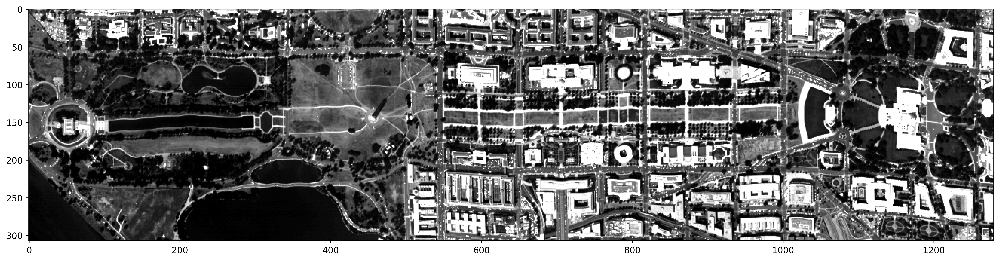

In [21]:
# -> Your code here
plt.figure(figsize=(20, 5), dpi=500)
imshow_stretch(np.flipud(data[:,:,bands_real[2]].T))

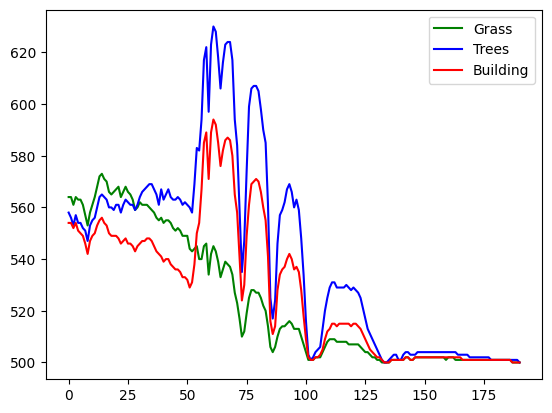

In [22]:
grass = (100, 390)
trees = (210, 200)
building = (100, 600)

plt.plot(data[grass[1], grass[0], :], 'g', label='Grass')
plt.plot(data[trees[1], trees[0], :], 'b', label='Trees')
plt.plot(data[building[1], building[0], :], 'r', label='Building')

plt.legend()
plt.show()

### Answer :

- The wavebands between 0nm to 50nm are not informative to discriminate the differents types of material on the ground. Same for the wavebands higher than 125nm. Indeed, the pixels intensity for the grass, the trees and the buldings are almost the same. However, bands located between 50 and 125nm are really informative. As we can see, it is clearly possible to classify the different land type by just using some threshold value for trees, grass and building. Moreover, we have always the Trees pixel intensity that will be higher than the building and higher than the grass. The classification is the more accurate in this band, and the bands are informative. 

    The difference in intensity between each bands can be explained by the sensitivity of the sensor according to them. The PSF of the sensor may be less accurate on low and high bands. 

# 3.3 Analysis of band correlation

In order to check the correlation among bands, we look at the correlation matrix of the data, which shows the cross-correlation between pairs of bands. We have already provided you with the code for its calculation and display. The colorbar at the right side shows the Pearson correlation coefficient $\rho$. Small values denote low correlation, while large values high correlation.

* Describe how the correlation matrix looks like and make some remarks about it.

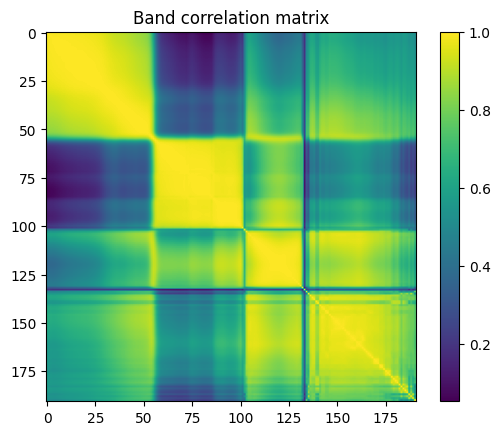

In [23]:
Cm = np.corrcoef(data_array[range(0,data_array.shape[0],100),:], rowvar=False)
plt.imshow(Cm)
plt.colorbar()
plt.title('Band correlation matrix')
plt.show()

### Answer :

- A high value of correlation between two bands means that they share a lot of information, redundant information. We may have to reduce the complexity of the model by selecting only the variable that contains most of the information. Therefore, as we can observe, the bands in the top left corner, between 0 and 50 and highgli multicorrealated. Meaning that they share a lot of information, these 50 bands could be summarize in just one, containing the major amount of information. Same for the bands between 50 and 100. Same for the bands between 100 and 125 and lastly same for 125 till the end. The observation is the same as what we said before : some intervals of bands could be sulmmarize in only one. 

# 3.4 Data dynamics

Check the dynamic of the data by looking at the standard deviation of each band. We have already provided you with the code for its calculation and display.

* Which bands are the most “informative”? (For example, you can show a band with high and one with low standard deviation and compare them)
* What can you assert by looking at this plot?

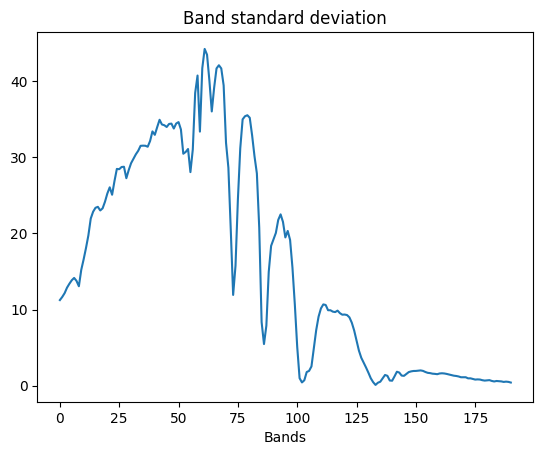

In [24]:
sigma = np.std(data_array, axis=0)
plt.figure()
plt.plot(sigma)
plt.xlabel('Bands')
plt.title('Band standard deviation')
plt.show()


### Answer :

- The more the variance is high and the more the pixels that a band contains may be informative on the variety of the land type that it contains. For a band, high variance means high variation of pixels intensity and therefore, more insights on how could we classify the different field types on the image. Then, the bands between 25 to 75 may be the more informative because they have the more variance. Whereas high bands, more than 125 have very low variance, so contains very few information about the ground composition. These observation confirm our past comments, the most informative bands are located approximately on the center indexes.
(makes sense according to PCA, orthogonal projection that maximizes the variance)

# 4. Dimensionality reduction

In this part, you are asked to analyze how a reduction of the data dimensions (initially, there are 191 bands) can still retain most of the information linked to the data variability and under which conditions this may be possible.

You will make a Principal Component Analysis (PCA). Roughly speaking, the PCA is a linear transformation which reprojects the data in another space which axes are the direction of **maximum variability**. Therefore, the **intuition** behind this is that the transformation will retain the main variability (information) of the data.

In addition, given $N$ the dimensionality of the data, it is possible to select the first $k \ll N$ *principal components* (which correspond to the eigenvectors associated to the $k$ largest eigenvalues of the covariance matrix of the data) for obtaining a representation of the data which retains as much variability as possible.

We have already provided you with the code for its calculation, but please take a little bit of time to analyze it and understand how the PCA works.

This version of the PCA code is far unefficient with respect to ones that you can find in standard statistical libraries. In fact, the calculation of the covariance matrix become harder and harder as the dimensionality increases. Efficient methods overcome this calculation by recalling some properties which link the data to the eigenvalues and eigenvectors of the covariance matrix.

In [25]:
Sigma = np.cov(data_array, rowvar=False)  # covariance matrix
[U, S, V] = np.linalg.svd(Sigma)  # U: eigenvectors of Sigma, S: eigenvalues of Sigma
D = data_array - np.mean(data_array, axis=0)  # center the data: rigid rotation

Dp = np.dot(data_array, U)  # linear transformation

In [26]:
data_array.shape

(392960, 191)

Inspect the eigenvalues (e.g., `plot(S[:k])` for the first *k* eigenvalues). You will find out that the eigenvalues are sorted by decreasing value (the same sorting goes for the eigenvectors `U`). You can show that the sum of the eigenvalues is equal to the trace of the covariance matrix, that is the total variance (**variance preservation**).

* Each eigenvalue accounts for a certain fraction of explained variance of the original data. Inspect which is that fraction of variance associated to the data

* About how many components do you think are relevant for a good approximation of the data? Why?

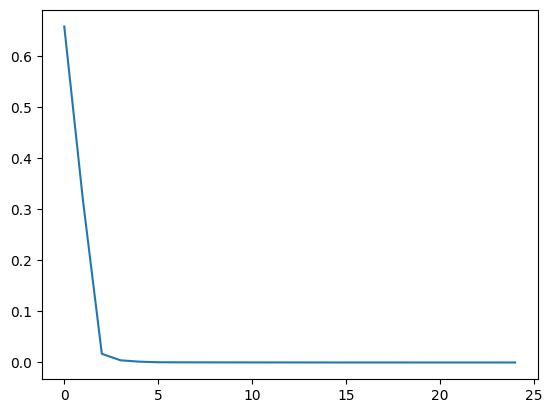

In [27]:
# -> Your code here
k = 25
plt.plot(S[:k]/np.sum(S))

In [28]:
(S[:5]/np.sum(S)) * 100

array([65.85758025, 31.6169414 ,  1.69970941,  0.42310893,  0.16229765])

### Answer :

- As we can notice, the first 2 components almost hold all the information about the data variance. Which means that our hyperspectral problem can finally be only decomposed in a 2D problem, it will gather almost all the information. Only the three first component are informative.

Show the principal components. In order to show them you need to reorganize the data in matrix format (e.g., `PC1 = Dp[:, 0].reshape((n_rows, n_columns))` for the first PC).

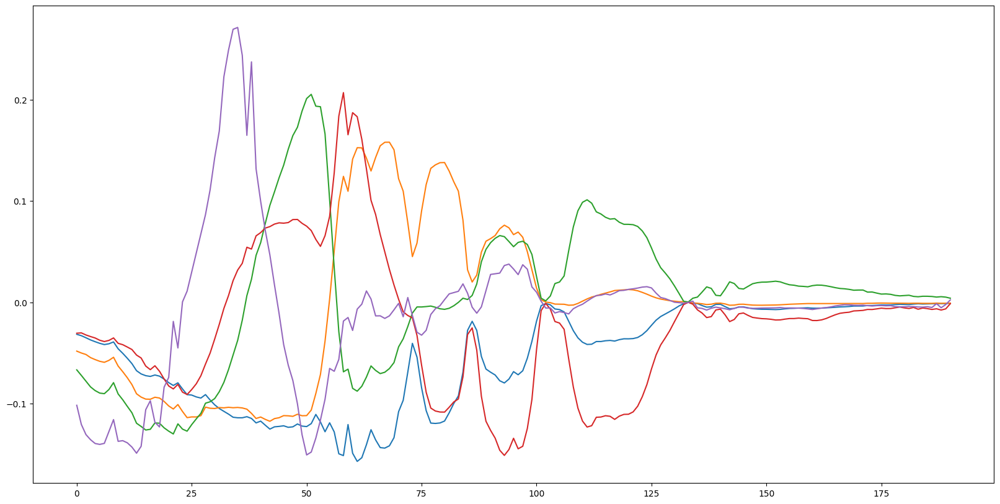

In [29]:

plt.figure(figsize=(20, 10))

plt.plot(U[:, :5])

plt.show()

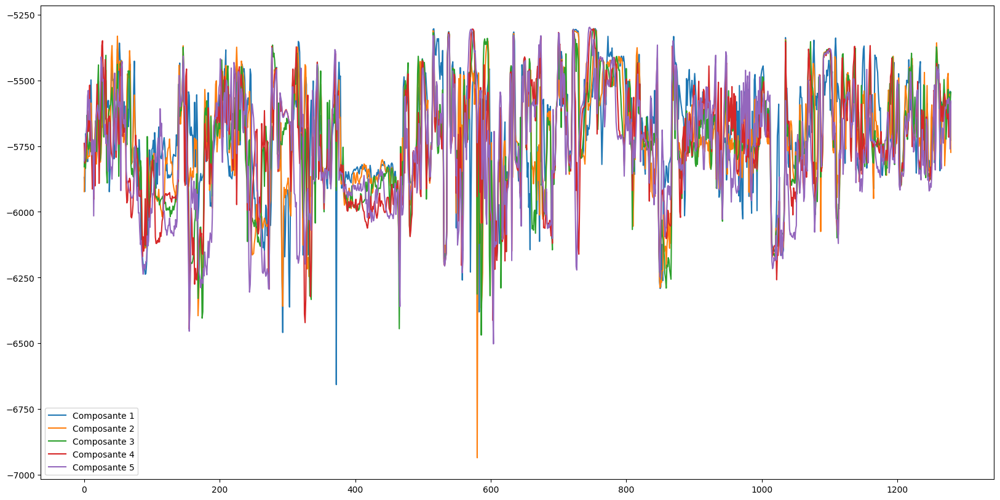

In [36]:
# -> Your code here
PC1 = Dp[:, 0].reshape((n_rows, n_columns))
res = PC1[:, -5:]

plt.figure(figsize=(20, 10))

for i in range(res.shape[1]):
    plt.plot(res[:, i], label=f'Composante {i+1}')

plt.legend()

plt.show()

* Do the components corresponding to the smallest eigenvalues show only noise?
* **[optional]** Why? (Hint: compute the covariance of the transformed data by tiping `Cp = np.cov(Dp, rowvar=False)` and set very low values to zero
`Cp[np.abs(Cp) < 1e-10] = 0`. You should find out that the matrix is diagonal. What does it mean? What does it imply?)

### Answer :

The more we go to the smallest eigenvalues and the more the components will capture precise details of the image. This is equivalent to say that the PCA over-fit the image's details. It captures too much small variations of noise.

# 5. Hyperspectral classification

This part is devoted to perform a classification of the data. In particular, by relying on the spectral information of the bands, we want to set a "supervised" learning task: we will have a **training set** consisting of pixels and labels, where each label is going to describe the material of that pixel. The **goal** will be to train a classifier by using `<pixel, label>` pairs, such that it learns how to classify the material of a pixel by relying on its spectral features. The classifier will be then tested on a test set for assessing its performance.

# 5.1 Training and test set creation

We will take 40 randomly chosen samples from the labeled set for each class in order to perform the training. The remaining samples will be used for the test. For creating the two sets run the following cell.

In [37]:

classes = np.unique(labels)
n_classes = classes.shape[0]

n_samples_per_class = 40

tr_idx, ts_idx = gen_train_test(orig_labels, labels, classes, n_samples_per_class)

X_train, y_train = data_array[tr_idx].astype('double'), orig_labels[tr_idx].ravel()
X_test, y_test = data_array[ts_idx].astype('double'), orig_labels[ts_idx].ravel()

# 5.2 Support Vector Machine (SVM) classification

You will perform the training of the SVM on the training set and run the inference (classification) on the whole data, while you will evaluate the performance only on the test data.

The **intuition** behind the Support Vector Machine is the so-called "maximum margin classification". Imagine a problem with two well-separable classes in a 2D feature space. A linear SVM will classify the samples by drawing a straight line for separating the two classes, such that it will maximize the distance from the nearest points of the two classes, as shown in the figure below.

![svm](figs/svm.png)
(Source: https://nlp.stanford.edu/IR-book/html/htmledition/img1260.png)

In more complex setting, SVM use a "soft margin" when the classes are not perfectly separable and will use the *Kernel trick* for drawing nonlinear decision shapes.

![svm-soft](figs/svm-soft.png)
(Source: https://www.researchgate.net/profile/Pierre_Louis_Frison/publication/224713410/figure/fig1/AS:382573722259457@1468224091559/SVM-classifier-scheme-a-Linear-and-b-nonlinear-cases.png)

In this notebook, the SVM you will use will have a Radial Basis Function (RBF) Kernel (or Gaussian kernel), whose mathematical formulation is the following:

$K(\mathbf{x}, \mathbf{y}) = exp(
  \frac {\lVert \mathbf{x} - \mathbf{y} \rVert ^ 2} {2\sigma^2}
)$, where often $\gamma = \frac{1}{2\sigma^2}$.

The $\gamma$ parameter controls the shape of the nonlinear decision boundary. Small values of gamma will correspond to smoother shapes around the support vectors (large standard deviation), while larger values of gamma will let the decision boundary to follow more and more the support vectors (small standard deviation) with the risk of overfitting the data.

Conversely, the $C$ parameter of SVM will (inversely) control the amount of regularization of the model. Large values of C will make the margin to be hard, with little or no flexibility for misclassified samples, while smaller values of C will let the margin to be soft and relax the maximal margin condition in the optimization function.

In this case, you will have these two free parameters to adjust for the classification in the second part of the exercise.

In addition, the data are scaled in order to better condition the underlying optimization problem.

N.W.: do not forget to scale (or inverse-scale) the data for avoiding inconsistent results!

In [38]:
# data scaling: they will have zero mean and unit standard deviation
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

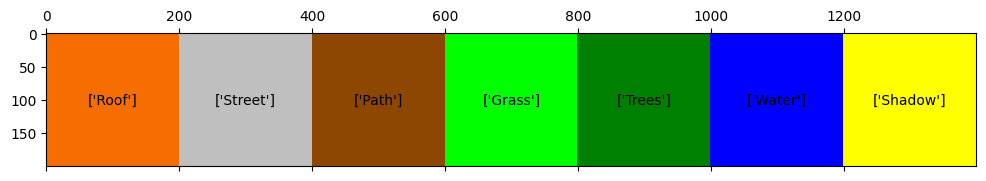

In [39]:
# useful colormap tools for displaying the classification results
colors = [class_colormap[i] for i in range(len(class_colormap))]
cmap = matplotlib.colors.ListedColormap(colors, name='colors', N=None)

# reminder of the class colors
fig, ax = plt.subplots(figsize=(12,8))
color_matrix = np.zeros((200, 200 * n_classes))
for i in range(n_classes):
    color_matrix[:, i * 200 : (i + 1) * 1200] = i + 1

ax.matshow(color_matrix, cmap=cmap)
for i in range(n_classes):
    ax.text(100 + 200 * i, 100, class_names.ravel()[i], va='center', ha='center')
plt.show()

We can thus instantiate a Support Vector Classifier (SVC) object and train it with the training data (fit).

We choose for you $C=100$ and $\gamma$ inversely proportional to the dimensionality of the data (use the keyword parameter `gamma='auto'`). There are pretty interesting motivations behind the tuning of the $\gamma$ parameter, but they go beyond the scope of the exercise and therefore will not be addressed.

Do not forget to change the value of $\gamma$ according to the dimensionality of the data (e.g., if you are classifying by using only 5 bands, therefore the value of $\gamma$ should be 1/5).

In [40]:
# Classification with SVM

svm = SVC(kernel='rbf', C=100, gamma=1/data_array.shape[1])

svm.fit(X_train, y_train)


SVC(C=100, gamma=0.005235602094240838)

Once fitted, the model can be used in inference mode, that is it can be used for classifying new pixels. We use it first for classifying the whole image. Then we use it for evaluating the test pixels and on that set of samples we compute also the Overall Accuracy, which represents the fraction of well classified samples.

In [41]:
# Inference and accuracy calculation
pred = svm.predict(scaler.transform(data_array))  # classification of the total image
acc = svm.score(X_test, y_test)  # TEST mean accuracy (n. correctly classified test samples / total n. test samples)
print('Mean TEST Overall Accuracy (OA):', acc)

Mean TEST Overall Accuracy (OA): 0.9870496217463778


We can display the classification result.

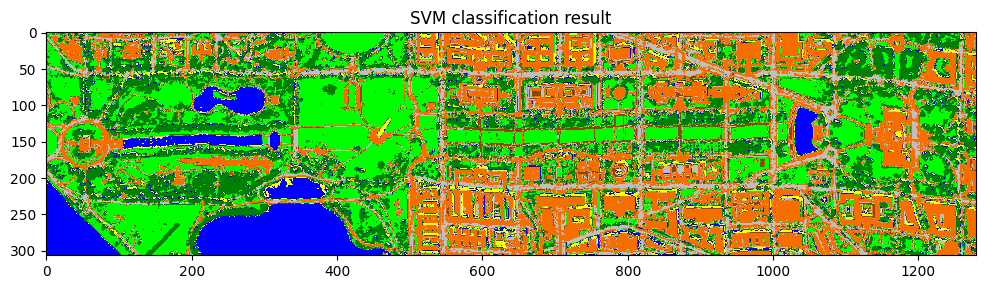

In [42]:
# Classification result visualization
plt.figure(figsize=(12,8), dpi= 100)
plt.imshow(np.flipud(pred.reshape(n_rows, n_columns).T), cmap=cmap)  # rotated for better visualization
plt.title('SVM classification result')
plt.show()

# 5.3 Performance assessment

If we only analyze the overall accuracy (OA) and we only look at the classified image, we could achieve misleading results, even if the image looks fine "by eye" and the OA is close to 100%, as in this case.

A useful tool for inspecting the complete classification result is the **Confusion Matrix**. The generic element $C_{i,j}$ of this matrix represents the number of samples that is known to belong to class $i$ and has been predicted as belonging to class $j$. We can now note that the overall accuracy is, in fact, the sum of the element on the diagonal of the confusion matrix. The out-of-diagonal elements are all those misclassified samples which were assigned to a class $j$ but belonged to class $i$ or vice-versa (see the examples in the cells below for better understand).

* **[optional]** In which cases the overall accuracy would lead to misleading results? Can you provide a concrete example?

### Answer :
Imagine that we have an unbalanced data set for our classification task, containing 0.90% of label 1 and 0.10% of label 0 for the training. Our model may only fit the label 1 during training and does not capture any informations about the label 0. Moreover, because the proportion of label 0 is inferior to the one of label 1, the missclasification rate on label 0 will be hidden inside the good model resulting accuracy. The model is not capable of detecting label 0 while it has a good accuracy : misleading results. In this case, the confusion matrix can be usefull. 


\
\
From the confusion matrix we can define further indexes, which are general concepts but we'll particularize them to our case.

1. Producer's accuracy (recall): defined as the fraction of true positives over the sum of true positive and false negatives: $R = \frac{TP}{TP + FN}$. It describes the "omission errors", that is all the cases in which the classifier has **failed to apply the correct label**.
2. User's accuracy (precision): defined as the fraction of true positives over the sum of true positives and false positives: $P = \frac{TP}{TP + FP}$. It describes the "commission errors", that is all the cases in which the classifier **applies the wrong label**.

The recall is also called "sensitivity": it measures the fraction of **positives which are correctly identified**.
The precision is also called "specificity": it measures the fraction of **negatives which are correctly identified**.

An example of interpretation of these two indexes is provided just below.

In a real scenario, both of these two indexes cannot be both high at the same time, although it is ideally what we would like.

\
Both these two indicators are complementary to the overall accuracy. Their harmonic mean is called F1-score (or F-score) $F = \frac{2}{\frac{1}{R} + \frac{1}{P}}$ and constitutes a more robust index for the assessment of classification results.




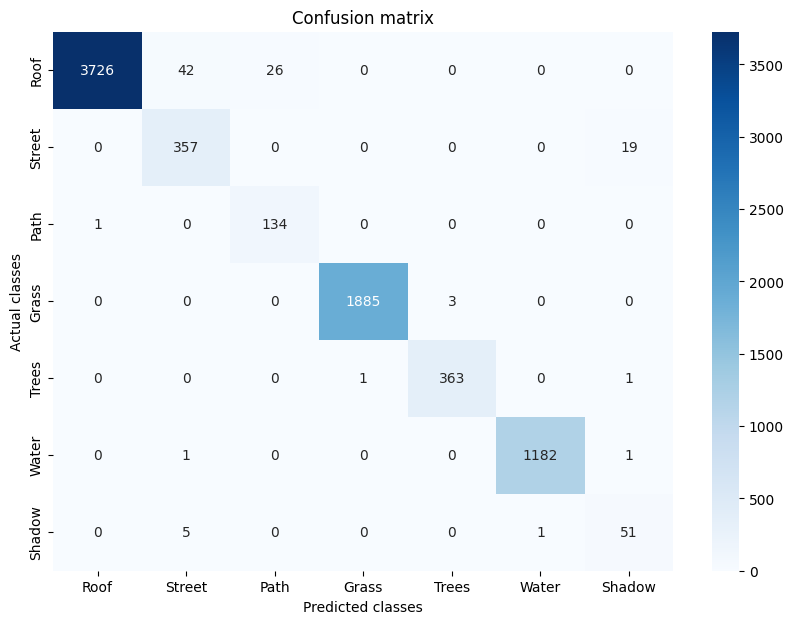

In [43]:
# Confusion matrix analysis
cl = ['Roof', 'Street', 'Path', 'Grass', 'Trees', 'Water', 'Shadow']
y_predicted = svm.predict(X_test)
cm =confusion_matrix(y_test, y_predicted)

df_cm = pd.DataFrame(cm, index = [i for i in cl],
                  columns = [i for i in cl])
plt.figure(figsize = (10,7))
sns.heatmap(df_cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted classes')
plt.ylabel('Actual classes')
plt.title('Confusion matrix')
plt.show()


In [44]:
# further indices
p = precision_score(y_test, y_predicted, average=None)
r = recall_score(y_test, y_predicted, average=None)
fs = f1_score(y_test, y_predicted, average=None)
print("Recalls:", r)
print("Precisions:", p)
print("F1-Scores:", fs)

Recalls: [0.98207696 0.94946809 0.99259259 0.99841102 0.99452055 0.99831081
 0.89473684]
Precisions: [0.99973169 0.88148148 0.8375     0.99946978 0.99180328 0.99915469
 0.70833333]
F1-Scores: [0.99082569 0.91421255 0.90847458 0.99894012 0.99316005 0.99873257
 0.79069767]


Let's take the class 1 (Roof) as an example. The recall is a measure of the model's ability to correctly classify the positive samples. By looking at the confusion matrix, we can look at the first row, in correspondence of the samples that we *know* they belong to class 1. In fact, 42 of that samples were classified as Street and 26 as Path. Therefore we have $42 + 26$ false negatives, that is samples which belong to Roof class but which were erroneously classified. This means that $R_{Roof} = \frac{3726}{3726 + 42 + 26} = 0.98$.

Conversely, if we look at the Path class, we know that 134 samples were correctly classified, but if we look at its column, we see that 26 samples have been classified as Path but they belonged to the Roof class. Therefore, this 26 samples are false positives, that is samples that have been classified as correct but they were not. This means that $P_{Path} = \frac{134}{134+26}=0.83$.

# 5.4 Further analyses

Perform the same procedures but considering only
1. a single band (arbitrarily chosen)
2. the three bands used for the
true color composition and
3. the three bands chosen for the false color composition.

Comment the results.
* How the change in the bands affect the results? Why?
* Are you able to detect and comment which are the differences in the predictions between the different procedures?
* By looking at the confusion matrix and the indices, which conclusion can you draw? Which do you expect from it?

\
Look again at the plot of the standard deviation of the bands. Perform a classification excluding ranges of bands with low (high) standard deviation.
* What do you expect will happen to the classification accuracy?
* The results agree with your expectations?

\
**[Optional]** Perform now a classification by using the data on which you applied PCA.
* How many principal components would you choose? Why? (Hint: look at the wavelengths of the sensor. Do the majority of the bands cover a common part of the spectrum? If yes, what can we conclude from that? What could be a possible strategy?)

**[Optional]** Perform some of the tests already done considering a different number of training samples (change the second input parameter of gen_train_test).
* What do you expect will happen? Comment briefly and compare it with the actual results.

**[Optional]** Perform further test by changing:
  * the value of the penalization $C$
  * the value of $\gamma$
  * the kernel (you can either instantiate the object `LinearSVC` or using `SVC` adding the keyword parameter `kearnel='linear'`).

  How the change in these parameters affect the classification? Comment the results.

### Answer :

### For a single band, randomly :

(392960, 1)
(280, 1)
(7799, 1)
Mean TEST Overall Accuracy (OA): 0.653160661623285


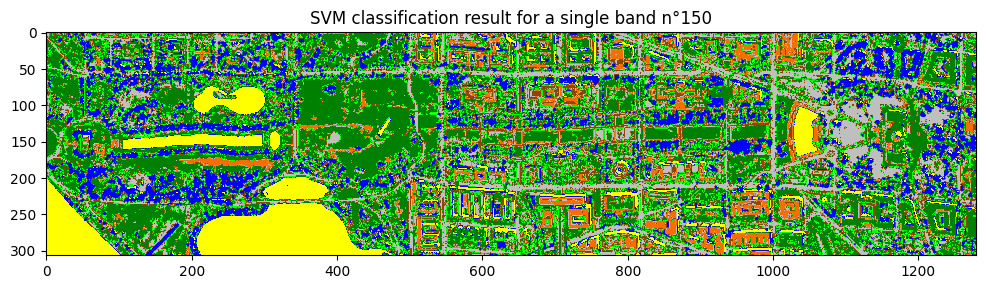

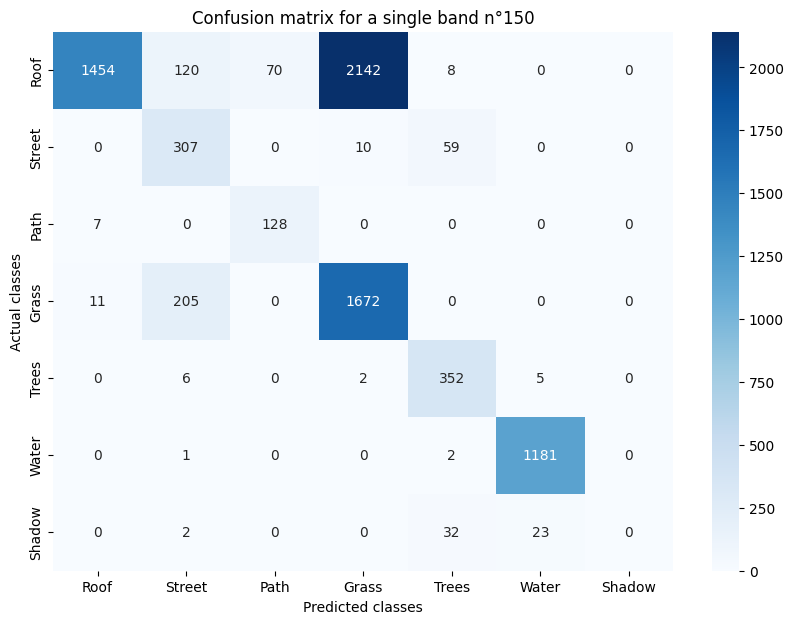

In [95]:
band = np.random.randint(data_array.shape[1]) # 125 marche bien
band=150
one_band_array = data_array[:, band]
one_band_array = one_band_array[:, np.newaxis]
print(one_band_array.shape)

classes = np.unique(labels)
n_classes = classes.shape[0]

n_samples_per_class = 40

tr_idx, ts_idx = gen_train_test(orig_labels, labels, classes, n_samples_per_class)

X_train, y_train = one_band_array[tr_idx].astype('double'), orig_labels[tr_idx].ravel()
X_test, y_test = one_band_array[ts_idx].astype('double'), orig_labels[ts_idx].ravel()

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

print(X_train.shape)
print(X_test.shape)

svm = SVC(kernel='rbf', C=100, gamma=1/one_band_array.shape[1])
svm.fit(X_train, y_train)

pred = svm.predict(scaler.transform(one_band_array))  # classification of the total image
acc = svm.score(X_test, y_test)  # TEST mean accuracy (n. correctly classified test samples / total n. test samples)
print('Mean TEST Overall Accuracy (OA):', acc)

plt.figure(figsize=(12,8), dpi= 100)
plt.imshow(np.flipud(pred.reshape(n_rows, n_columns).T), cmap=cmap)  # rotated for better visualization
plt.title(f'SVM classification result for a single band n°{band}')
plt.show()

cl = ['Roof', 'Street', 'Path', 'Grass', 'Trees', 'Water', 'Shadow']
y_predicted = svm.predict(X_test)
cm =confusion_matrix(y_test, y_predicted)

df_cm = pd.DataFrame(cm, index = [i for i in cl],
                  columns = [i for i in cl])
plt.figure(figsize = (10,7))
sns.heatmap(df_cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted classes')
plt.ylabel('Actual classes')
plt.title(f'Confusion matrix for a single band n°{band}')
plt.show()

- As we saw earlier in our data analysis, some bands are more relevant than other for our ground classification task. Therefore, taking a singular randomly choosen band is likely to lead to a bad classification accuracy, especially if the band has index more or around 150 (according to our previous findings). Hence, if we are lucky, we randomly get a band index that is very discriminative such as indexes between 60-75;75-100;100-125 and we get a satisfying classification results (~60% of accuracy). Otherwise, we get a band index that is poorly informative s.a around 150 and we get a low accuracy.

### True color composition :

(392960, 3)
(280, 3)
(7799, 3)
Mean TEST Overall Accuracy True Color bands (OA): 0.855622515707142


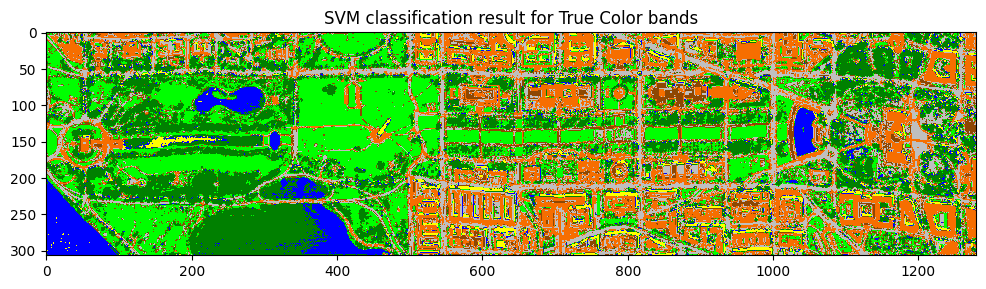

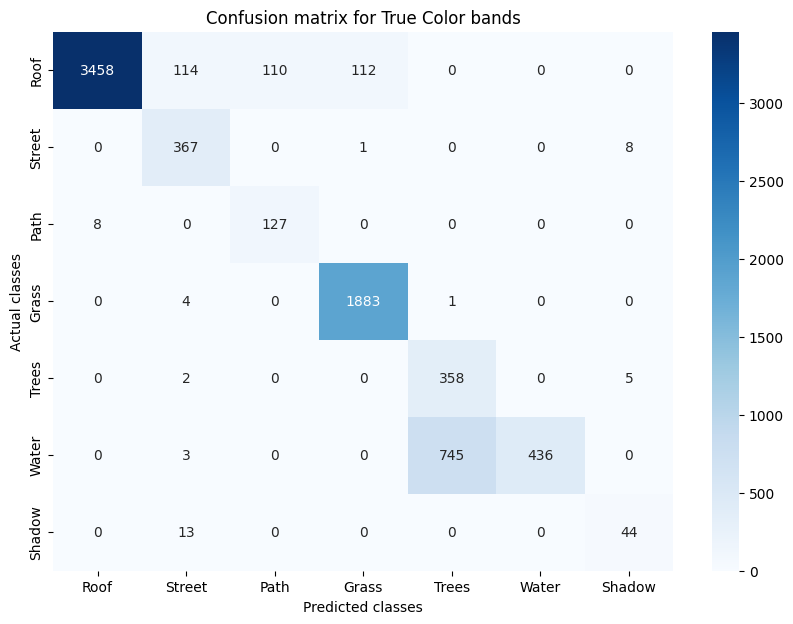

In [97]:
bands_real_array = data_array[:, bands_real]
print(bands_real_array.shape)

classes = np.unique(labels)
n_classes = classes.shape[0]

n_samples_per_class = 40

tr_idx, ts_idx = gen_train_test(orig_labels, labels, classes, n_samples_per_class)

X_train, y_train = bands_real_array[tr_idx].astype('double'), orig_labels[tr_idx].ravel()
X_test, y_test = bands_real_array[ts_idx].astype('double'), orig_labels[ts_idx].ravel()

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

print(X_train.shape)
print(X_test.shape)

svm = SVC(kernel='rbf', C=100, gamma=1/bands_real_array.shape[1])
svm.fit(X_train, y_train)

pred = svm.predict(scaler.transform(bands_real_array))  # classification of the total image
acc = svm.score(X_test, y_test)  # TEST mean accuracy (n. correctly classified test samples / total n. test samples)
print('Mean TEST Overall Accuracy True Color bands (OA):', acc)

plt.figure(figsize=(12,8), dpi= 100)
plt.imshow(np.flipud(pred.reshape(n_rows, n_columns).T), cmap=cmap)  # rotated for better visualization
plt.title(f'SVM classification result for True Color bands')
plt.show()

cl = ['Roof', 'Street', 'Path', 'Grass', 'Trees', 'Water', 'Shadow']
y_predicted = svm.predict(X_test)
cm =confusion_matrix(y_test, y_predicted)

df_cm = pd.DataFrame(cm, index = [i for i in cl],
                  columns = [i for i in cl])
plt.figure(figsize = (10,7))
sns.heatmap(df_cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted classes')
plt.ylabel('Actual classes')
plt.title(f'Confusion matrix for True Color bands')
plt.show()

- Results are well satisfying as expected ~0.85% of accuracy. Indeed, only by looking at the initial true color image, we could classify the different materials easily.

### False color band :

(392960, 3)
(280, 3)
(7799, 3)
Mean TEST Overall Accuracy False Color bands (OA): 0.849083215796897


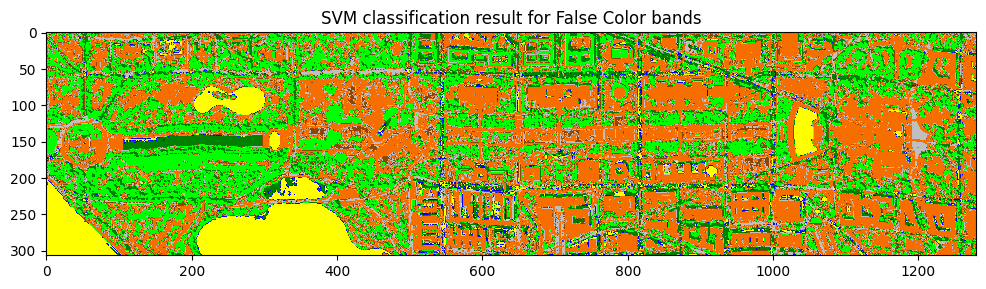

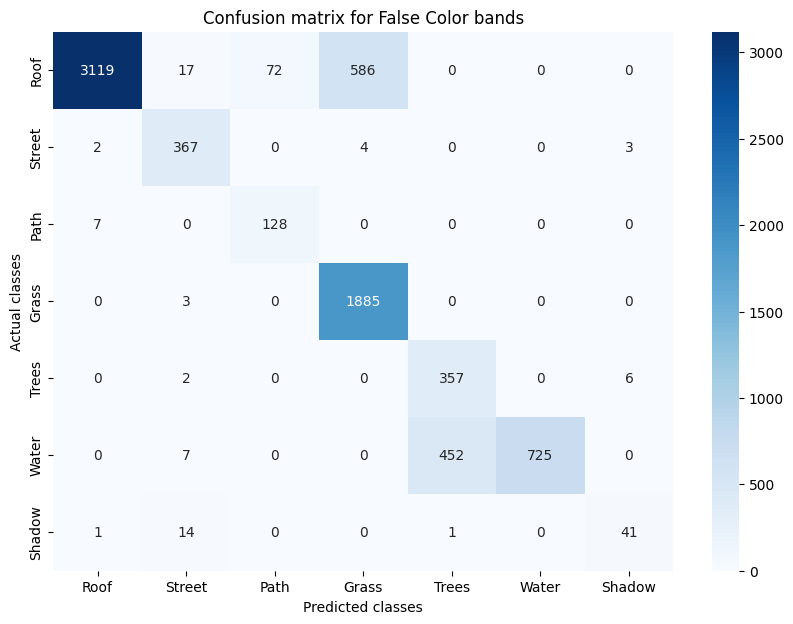

In [98]:
bands_false_array = data_array[:, bands_false]
print(bands_false_array.shape)

classes = np.unique(labels)
n_classes = classes.shape[0]

n_samples_per_class = 40

tr_idx, ts_idx = gen_train_test(orig_labels, labels, classes, n_samples_per_class)

X_train, y_train = bands_real_array[tr_idx].astype('double'), orig_labels[tr_idx].ravel()
X_test, y_test = bands_real_array[ts_idx].astype('double'), orig_labels[ts_idx].ravel()

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

print(X_train.shape)
print(X_test.shape)

svm = SVC(kernel='rbf', C=100, gamma=1/bands_false_array.shape[1])
svm.fit(X_train, y_train)

pred = svm.predict(scaler.transform(bands_false_array))  # classification of the total image
acc = svm.score(X_test, y_test)  # TEST mean accuracy (n. correctly classified test samples / total n. test samples)
print('Mean TEST Overall Accuracy False Color bands (OA):', acc)

plt.figure(figsize=(12,8), dpi= 100)
plt.imshow(np.flipud(pred.reshape(n_rows, n_columns).T), cmap=cmap)  # rotated for better visualization
plt.title(f'SVM classification result for False Color bands')
plt.show()

cl = ['Roof', 'Street', 'Path', 'Grass', 'Trees', 'Water', 'Shadow']
y_predicted = svm.predict(X_test)
cm =confusion_matrix(y_test, y_predicted)

df_cm = pd.DataFrame(cm, index = [i for i in cl],
                  columns = [i for i in cl])
plt.figure(figsize = (10,7))
sns.heatmap(df_cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted classes')
plt.ylabel('Actual classes')
plt.title(f'Confusion matrix for False Color bands')
plt.show()

- False color too, satisfying classification accuracy ~0.84%. It is less than the True Color which makes sense, both color vision where highligtings different patterns of the grounds and the False color one was more focusing on detailed variation of grass, trees and path. 

### Overall comments :

- The true color composition will have more difficulties to classify correctly trees and water. Indeed, according to the confusion matrix, 745 water pixels where classified as trees by the model. However for false color bands, the difficulty also exist but less present, only 452 water pixels were predicted as trees by the model. Then, to correctly identify trees, we will prefer the False color bands.
- However, the False color composition will often predict Grass as building roofs : 586. In comparison, True color is more accurate with only 112 grass pixels were predicted as roof.
- Finally, if we want to emphasis on the correct detection of trees, we may look at the False Color bands image. If we want to accuratly differentiate roof and buildings, we may have to look at the True Color bands.  

# 6. Spatial-Spectral classification

Till now the classification performed on the data was only relying on the spectral characteristics of the pixels. No exploitation of the spatial arrangement of the pixels was done. In order to take this complementary source of information into account, we can consider “spatial features”: features that model the spatial information (e.g., spatial correlation of **neighboring** pixels, **geometrical** characteristics of the objects, etc). Once computed, these features can be considered by a classifier.
There are many ways to extract spatial features. In this lab session we will consider the features derived by an Extended Morphological Profile (EMP) (see the paper `ClassificationEMP.pdf` in the doc folder for more information). The EMP is composed by a concatenation of Morphological Profiles (MPs). An MP is a sequence of opening and closing by reconstruction with a structuring element of fixed shape and increasing size and can be considered as a multiscale representation of the image. A representation is given in the image below.

<img src="figs/MP.png" alt="MP" style="width: 500px;"/>

The EMP is obtained by concatenating different MPs each one computed on one of the first Principal Components of the image (see figure below).

<img src="figs/EMP.png" alt="EMP" style="width: 500px;"/>

The MP is implemented by the function `morph_prof` defined at the beginning of the notebook.

The EMP is obtained by considering the first principal components of the image. The example below shows how to build an EMP considering the first 3 PCs, with MPs computed with circular structuring elements with initial radius 1, increment step size of 3 and 4 levels (thus, leading to an MP of 9 = 4 closings + original image + 4 opening)

* Have a look to the spatial features in the EMP and make some remarks.

### Answer :

The EMP helps to distinguish the ground composition with respect to the spatial distance each pixels and their spectral information. By looking at the components, we can clearly see that some parts of the image are gathered in space, they represent same material neighborhood. For instance, in components between 9 and 17, The Grass in the center of the image is highlight, whereas the sets of building all around are darker. All the components identify different patterns, from the most general ones at the beginning to the most specific at the end. It is an additionnal space information that helps for ground classification.

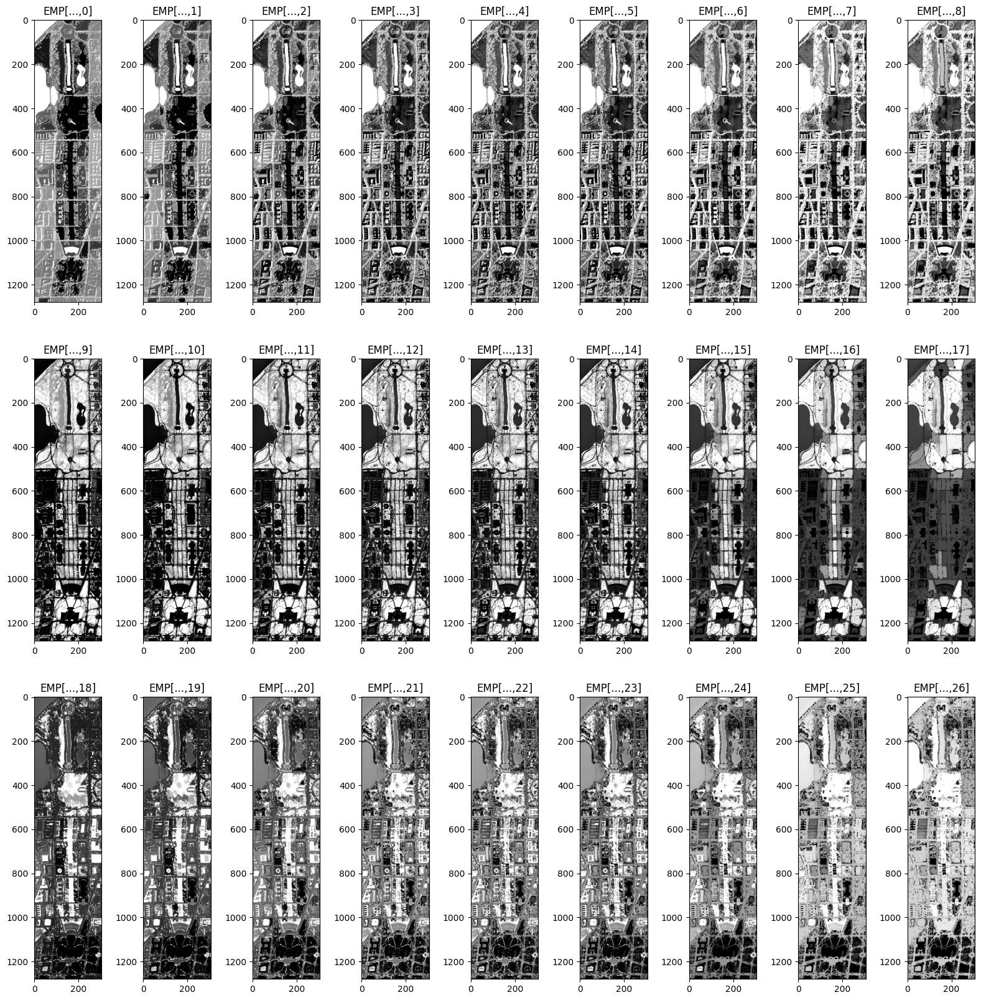

In [130]:
# ASNWER
EMP = np.zeros((n_rows, n_columns, 27))
for i in range(3):
    MP = morph_prof(Dp[:,i].reshape(n_rows, n_columns), 1, 3, 4)
    EMP[:,:,9 * i : 9 * (i + 1)] = MP

# TO DO --> visualize the EMP and give some comments
plt.figure(figsize=(20, 20))
for i in range(EMP.shape[-1]):
    plt.subplot(3, EMP.shape[-1] // 3, i + 1)
    imshow_stretch(EMP[..., i])
    plt.title('EMP[...,{}]'.format(i))
plt.show()

Perform a classification considering the EMP. Note that the EMP, after its computation, is a stack of images. Thus, it should be converted in vector format for obtaining a vector whose shape is `(n_rows * n_columns`, `num levels of EMP)`.

* Comment the results. What do you expect? Does the classifier exploit the spatial features? This let the model achieve better performances? Comment all this aspects. Are there any areas in the image in which you clearly see a better classification? Do you figure out why?

* **[Optional]** Perform a classification of each MP. Change the settings of the MP (size of the SE, number of levels) and see the changes in the classification.

* **[Optional]** Perform a classification concatenating the EMP and the original image.

In [135]:
EMP_vectorized = EMP.reshape((EMP.shape[0] * EMP.shape[1], EMP.shape[2]))

print(EMP_vectorized.shape)

classes = np.unique(labels)
n_classes = classes.shape[0]

n_samples_per_class = 40

tr_idx, ts_idx = gen_train_test(orig_labels, labels, classes, n_samples_per_class)

X_train, y_train = EMP_vectorized[tr_idx].astype('double'), orig_labels[tr_idx].ravel()
X_test, y_test = EMP_vectorized[ts_idx].astype('double'), orig_labels[ts_idx].ravel()

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

print(X_train.shape)
print(X_test.shape)

(392960, 27)

In [139]:
svm = SVC(kernel='rbf', C=100, gamma=1/EMP_vectorized.shape[1])
svm.fit(X_train, y_train)

pred = svm.predict(scaler.transform(EMP_vectorized))  # classification of the total image
acc = svm.score(X_test, y_test)  # TEST mean accuracy (n. correctly classified test samples / total n. test samples)
print('Mean TEST Overall Accuracy EMP (OA):', acc)

Mean TEST Overall Accuracy EMP (OA): 0.9924349275548148


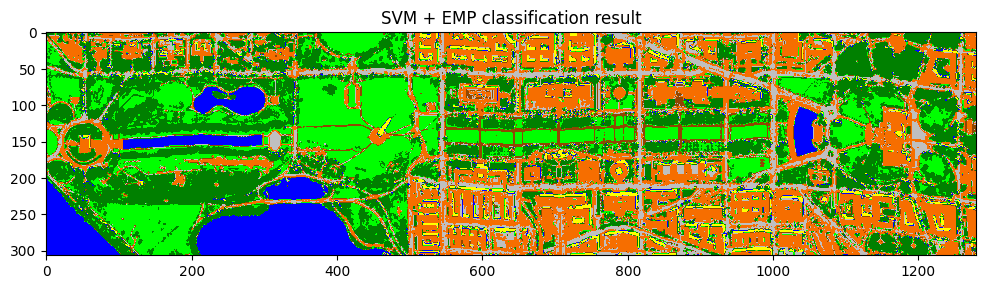

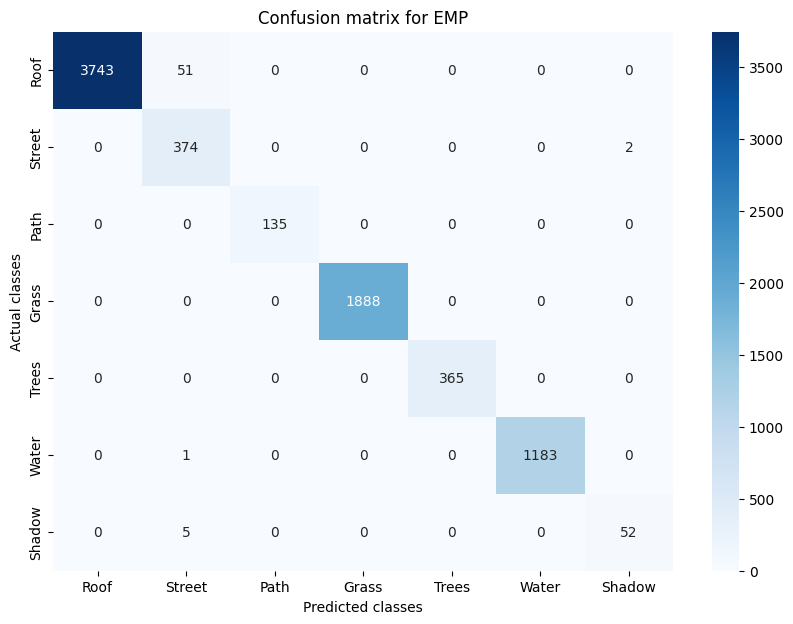

In [140]:
plt.figure(figsize=(12,8), dpi= 100)
plt.imshow(np.flipud(pred.reshape(n_rows, n_columns).T), cmap=cmap)  # rotated for better visualization
plt.title(f'SVM + EMP classification result')
plt.show()

cl = ['Roof', 'Street', 'Path', 'Grass', 'Trees', 'Water', 'Shadow']
y_predicted = svm.predict(X_test)
cm =confusion_matrix(y_test, y_predicted)

df_cm = pd.DataFrame(cm, index = [i for i in cl],
                  columns = [i for i in cl])
plt.figure(figsize = (10,7))
sns.heatmap(df_cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted classes')
plt.ylabel('Actual classes')
plt.title(f'Confusion matrix for EMP')
plt.show()

### ANSWER :

As we said in our previous observations of the EMP components, we take into account spatial (neighbors) and spectral informations, leading to an almost perfect classification accuracy. We no longer have issues in detecting tree pixels with respect to water. Same for the Grass with respect to the building's roof. Perfect detection of the water plans and of the grass fields that go trought the building. As we said in our previous observations, these grass fields where perfeclty highlighted in the components 9 to 17 of the EMP, therefore the classification went well.

# Appendix $-$ data

The hyperspectral image of Washington DC mall will be used in this lab section (Figure 5) . The image was acquired by the airborne mounted Hyperspectral Digital Imagery Collection Experiment (HYDICE) sensor over the the Mall in Washington, DC. The image comes along with MultiSpec (a freeware multispectral image data analysis system developed at Purdue Uni- versity) and is available at https://engineering.purdue.edu/~biehl/MultiSpec/hyperspectral.html. It is provided with the permission of Spectral Information Technology Application Center of Virginia who was responsible for its collection. The sensor system used in this case measured pixel response in 210 bands in the 0.4 to 2.4 μm region of the visible and infrared spectrum. Bands in the 0.9 and 1.4 μm region where the atmosphere is opaque have been omitted from the data set, leaving 191 bands. The data set contains 1208 scan lines with 307 pixels in each scan line with a spatial resolution of about 2.8 m. Seven thematic land cover classes are present in the scene: Roofs, Street, Path (graveled paths down the mall center), Grass, Trees, Water, and Shadow.

Below the Washington DC Mall data set is shown (false color composite).

<img src="figs/dc.png" alt="dc-mall" style="width: 1000px;"/>